In [78]:
# Importing different packages and modules

import pandas as pd
import re
import nltk
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('omw-1.4')
nltk.download(['stopwords','wordnet'])
from bs4 import BeautifulSoup
import nltk
nltk.download('punkt')
import warnings 
warnings.filterwarnings('ignore')
import string
from nltk.corpus import stopwords
from wordcloud import WordCloud
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from gensim import corpora
import pyLDAvis.gensim_models
import numpy as np
import pandas as pd

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Bhume\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Bhume\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Bhume\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Bhume\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [79]:
# Reading data from CSV files

data=pd.read_csv("assignment_data.csv")

# Droping column from the data is missing

data.drop(data[(data['description'].isnull())].index, inplace=True)

# Converting the HTML document into Normal english text via BeautifulSoup module

for i in range(len(data)):
    if(i in data.index):
        soup = BeautifulSoup(data["description"][i])
        k=soup.body.get_text()
        data["description"][i]=k

In [80]:
# Cleaning the JOB description column using WordNetLemmatizer module 

clean=[]
for i in range(len(data)):
    if(i in data.index):
        review = re.sub('(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|^rt|http.+?"'," ",data["description"][i])
        review = review.lower()
        review = review.split()
        lm = WordNetLemmatizer()
        review = [
            lm.lemmatize(word)
            for word in review
            if not word in set(stopwords.words("english"))
        ]
        review = " ".join(review)
        clean.append(review)
        
# Storing the clean list(which contain the Job description) as a dataframe 

df = pd.DataFrame(clean, columns=['Clean_Job_decription'])

In [81]:
# Reading the Clean Job description column and extracting required Skills from the given information using en_core_web_sm module

nlp = en_core_web_sm.load()
skill_pattern_path = "jz_skill_patterns.jsonl"
ruler = nlp.add_pipe("entity_ruler")
ruler.from_disk(skill_pattern_path)

# Creating function for extracting skills from Job description

def get_skills(text):
    doc = nlp(text)
    myset = []
    subset = []
    for ent in doc.ents:
        k=ent.label_.split()
        subset.append(ent.text)
    myset.append(subset)
    return subset

# Creating function for extracting unique skills from the extracted skills to avoid redundancy

def unique_skills(x):
    return list(set(x))

#Calling functions

df["skills"] = df["Clean_Job_decription"].str.lower().apply(get_skills)
df["skills"] = df["skills"].apply(unique_skills)

In [56]:
# Displaying the skills from Clean_Job_decription column using nlp & displacy module

for i in range(len(df)):
    sent = nlp(df["Clean_Job_decription"].iloc[i])
    displacy.render(sent, style="ent", jupyter=True)

In [82]:
df.to_csv("Bhum.csv")

In [83]:
if 'Clean_Job_decription' not in df.columns:
    df=df.T

# Counting the frequency of each word from Clean_Job_decription column to know which skill is demanded a lot

oneSetOfStopWords = set(stopwords.words('english')+['``',"''"])
totalWords =[]
Sentences = df.Clean_Job_decription.values
cleanedSentences = ""
for records in Sentences:
    cleanedSentences += records
    requiredWords = nltk.word_tokenize(records)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)

# Printing 100 most common words(skills) from the Clean_Job_decription column of dataframe

mostcommon = wordfreqdist.most_common(100)
print(mostcommon)

[('experience', 5283), ('development', 3407), ('knowledge', 3257), ('project', 2732), ('team', 2389), ('skill', 2362), ('software', 2344), ('system', 2237), ('tool', 2122), ('requirement', 2088), ('test', 2077), ('management', 2004), ('design', 1743), ('customer', 1725), ('good', 1708), ('like', 1681), ('process', 1496), ('communication', 1477), ('work', 1333), ('technical', 1313), ('c', 1282), ('sw', 1217), ('product', 1209), ('data', 1204), ('testing', 1184), ('using', 1181), ('strong', 1140), ('solution', 1101), ('etc', 1065), ('embedded', 1062), ('application', 1043), ('automotive', 935), ('working', 921), ('analysis', 916), ('support', 910), ('business', 891), ('quality', 854), ('understanding', 827), ('hand', 804), ('sap', 798), ('year', 787), ('based', 780), ('implementation', 745), ('concept', 738), ('architecture', 731), ('ability', 723), ('integration', 721), ('programming', 707), ('technology', 683), ('responsible', 682), ('safety', 656), ('level', 640), ('added', 623), ('se

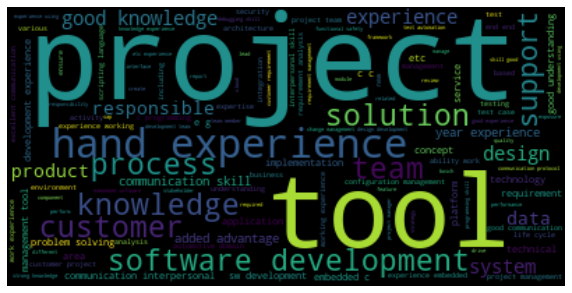

In [84]:
# Plotting the 100 most common words(skills) from the Clean_Job_decription column of dataframe

wc = WordCloud().generate(cleanedSentences)
plt.figure(figsize=(10,10))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [88]:
# Here we are clustering the data using two different methods one is using TfidfVectorizer module and one is using LabelEncoder
print(type(df["skills"]))
import pandas as pd
df=pd.read_csv("Bhum.csv")

<class 'pandas.core.series.Series'>


In [89]:
# Making model for Clustering the skills columns so that we can cluster the job Description using TfidfVectorizer module

vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(df["skills"])

true_k = 10
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X)

KMeans(max_iter=100, n_clusters=10, n_init=1)

In [90]:
# Printing the clusters features using vectorizer.get_feature_names()

order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(true_k):
    print("Cluster %d:" % i),
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind])

Cluster 0:
 java
 year
 azure
 python
 design
 software
 database
 framework
 data
 jenkins
Cluster 1:
 engineering
 software
 specification
 microcontroller
 security
 support
 ethernet
 design
 scripting
 language
Cluster 2:
 linux
 debugging
 android
 software
 git
 design
 middleware
 component
 embedded
 ethernet
Cluster 3:
 release
 design
 component
 software
 specification
 documentation
 support
 engineering
 integration
 collaboration
Cluster 4:
 business
 support
 year
 design
 process
 data
 specification
 documentation
 india
 accounting
Cluster 5:
 candela
 candiva
 canoe
 version
 control
 rtc
 microprocessor
 debugging
 kwp
 gitstrong
Cluster 6:
 algorithm
 software
 design
 simulation
 processing
 testing
 signal
 data
 learning
 framework
Cluster 7:
 management
 project
 software
 year
 design
 schedule
 component
 business
 release
 mpp
Cluster 8:
 interaction
 design
 debugging
 software
 testing
 framework
 specification
 support
 component
 documentation
Cluster 9

In [91]:
# Printing silhouette_score_tf which tells us that clusters are far away from each other

df['Tfidf Clus Label'] = model.labels_
df.groupby(['Tfidf Clus Label'])['skills'].count()
tfidf_vect = TfidfVectorizer()
tfidf = tfidf_vect.fit_transform(df['skills'].values)
model_tf = KMeans(n_clusters = 10,random_state=99)
model_tf.fit(tfidf)
labels_tf = model_tf.labels_
silhouette_score_tf = metrics.silhouette_score(tfidf, labels_tf, metric='euclidean')
print(silhouette_score_tf)

0.038709601737636386


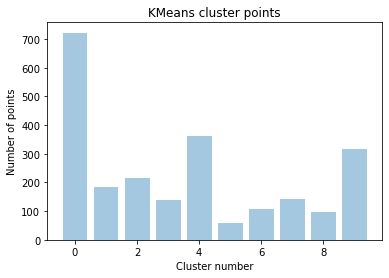

In [92]:
# Ploting the KMeans cluster points which me make using TfidfVectorizer module
plt.bar([x for x in range(10)], df.groupby(['Tfidf Clus Label'])['skills'].count(), alpha = 0.4)
plt.title('KMeans cluster points')
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

In [93]:
# LDA, or Latent Dirchlet Allocation is arguably the most famous topic modeling algorithm out there

# Making LDA model
docs = df["skills"].values
dictionary = corpora.Dictionary(str(d).split() for d in docs)
bow = [dictionary.doc2bow(str(d).split()) for d in docs]
lda = gensim.models.ldamodel.LdaModel
num_topics = 4
ldamodel = lda(
    bow, 
    num_topics=num_topics, 
    id2word=dictionary, 
    passes=50, 
    minimum_probability=0
)
ldamodel.print_topics(num_topics=num_topics)

[(0,
  '0.048*"\'software\']" + 0.029*"\'design\'," + 0.025*"[\'design\'," + 0.022*"\'support\']" + 0.018*"\'software\'," + 0.018*"\'component\'," + 0.015*"\'project" + 0.015*"\'monitoring\'," + 0.013*"year\'," + 0.013*"management\',"'),
 (1,
  '0.041*"\'software\'," + 0.040*"\'design\'," + 0.025*"system\'," + 0.021*"language\'," + 0.020*"\'testing\'," + 0.020*"\'linux\'," + 0.019*"\'python\'," + 0.019*"\'component\'," + 0.017*"\'debugging\'," + 0.016*"\'git\',"'),
 (2,
  '0.025*"\'data" + 0.021*"\'design\'," + 0.020*"year\'," + 0.017*"\'framework\'," + 0.016*"\'engineering\'," + 0.015*"\'python\'," + 0.013*"\'support\'," + 0.012*"\'deployment\'," + 0.011*"learning\'," + 0.011*"\'devops\',"'),
 (3,
  '0.051*"year\'," + 0.024*"\'software\'," + 0.023*"\'business\'," + 0.022*"\'design\'," + 0.022*"\'java\'," + 0.020*"\'testing\'," + 0.012*"\'spring\'," + 0.012*"\'framework\'," + 0.011*"\'2" + 0.010*"\'3"')]

In [94]:
# visualizing Topics which we make using LDA model by uisng pyLDAvis from GENSIM
pyLDAvis.enable_notebook()
pyLDAvis.gensim_models.prepare(ldamodel, bow, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.010444  0.208914       1        1  35.529409
2     -0.100326  0.000047       2        1  27.397376
3     -0.138041 -0.124192       3        1  24.205027
0      0.227923 -0.084769       4        1  12.868187, topic_info=                 Term        Freq       Total Category  logprob  loglift
78        'software']  160.000000  160.000000  Default  30.0000  30.0000
19             year',  503.000000  503.000000  Default  29.0000  29.0000
66           system',  238.000000  238.000000  Default  28.0000  28.0000
68         ['design',   82.000000   82.000000  Default  27.0000  27.0000
265             'data  229.000000  229.000000  Default  26.0000  26.0000
..                ...         ...         ...      ...      ...      ...
265             'data   29.389704  229.887611   Topic4  -4.7208  -0.0065
112  'documentation',   25.768142  183.611550   Topic4  -4.8523   0.0867
100              '1',   23.482473  116.345136   Topic4  -4.9452   0.4501
3                '2',   21.507665   96.132590   Topic4  -5.0330   0.5531
89     'engineering',   20.565606  205.710304   Topic4  -5.0778  -0.2524

[267 rows x 6 columns], token_table=      Topic      Freq             Term
term                                  
110       2  0.170067               '1
110       4  0.829077               '1
100       1  0.051571             '1',
100       2  0.472731             '1',
100       3  0.275044             '1',
...     ...       ...              ...
1156      2  0.974503  visualization',
283       3  0.952329             year
19        2  0.285841           year',
19        3  0.627262           year',
19        4  0.087340           year',

[335 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 4, 1])

In [95]:
print(df)

      Unnamed: 0                               Clean_Job_decription  \
0              0  know automotive diagnosis uds implementation i...   
1              1  total 4 year experience min 2 year experience ...   
2              2  total 8 year experience 3 year experience lead...   
3              3  work experience 8 12 yearswork location bangal...   
4              4  job description financial analysis reportingpr...   
...          ...                                                ...   
2340        2340  responsibility understand business use case su...   
2341        2341  work next generation braking platform like aut...   
2342        2342  strong development experience embedded c autom...   
2343        2343  responsibility utilizing microsoft net infrast...   
2344        2344  4 year experience full stack development using...   

                                                 skills  Tfidf Clus Label  
0                             ['debugging', 'security']                